In [ ]:
import os
import csv
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image, ImageFilter
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, mean_absolute_error, mean_squared_error
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import optuna
import seaborn as sns
import warnings
import hashlib
import math

warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
!mkdir -p ~/.kaggle

In [ ]:
!kaggle datasets download -d jangedoo/utkface-new

Dataset URL: https://www.kaggle.com/datasets/jangedoo/utkface-new
License(s): copyright-authors
 99% 328M/331M [00:16<00:00, 22.8MB/s]
100% 331M/331M [00:17<00:00, 20.4MB/s]


In [ ]:
with zipfile.ZipFile("utkface-new.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/UTKFace")

In [ ]:
def load_utkface_data(data_path):
    file_paths = []
    ages = []
    genders = []
    races = []

    file_list = os.listdir(data_path)

    for file in file_list:
        if len(file.split("_")) >= 4:
            try:
                age, gender, race, *_ = file.split("_")
                file_paths.append(os.path.join(data_path, file))
                ages.append(int(age))
                genders.append(int(gender))
                races.append(int(race))
            except ValueError:
                print(f"Skipping file {file} due to a parsing error")
        else:
            print(f"Skipping file {file} due to format error")

    metadata_df = pd.DataFrame({
        'file_path': file_paths,
        'age': ages,
        'gender': genders,
        'race': races
    })

    return metadata_df

In [ ]:
data_path = "/content/UTKFace/UTKFace"
metadata_df = load_utkface_data(data_path)

Skipping file 39_1_20170116174525125.jpg.chip.jpg due to format error
Skipping file 61_1_20170109150557335.jpg.chip.jpg due to format error
Skipping file 61_1_20170109142408075.jpg.chip.jpg due to format error


In [ ]:
metadata_df.head()

,file_path,age,gender,race
0,/content/UTKFace/UTKFace/23_1_2_20170116173110...,23,1,2
1,/content/UTKFace/UTKFace/22_1_1_20170114025927...,22,1,1
2,/content/UTKFace/UTKFace/60_0_0_20170111201520...,60,0,0
3,/content/UTKFace/UTKFace/65_0_3_20170117143046...,65,0,3
4,/content/UTKFace/UTKFace/35_0_0_20170120220510...,35,0,0


In [1]:
def assign_age_group(df):
    conditions = [
        (df['age'] <= 12),
        (df['age'] > 12) & (df['age'] <= 19),
        (df['age'] > 19) & (df['age'] <= 35),
        (df['age'] > 35) & (df['age'] <= 55),
        (df['age'] > 55)
    ]
    age_groups = ['Child', 'Teen', 'Young Adult', 'Adult', 'Senior']
    df['age_group'] = pd.cut(df['age'], bins=[-1, 12, 19, 35, 55, 120], labels=age_groups)
    return df

In [ ]:
metadata_df = assign_age_group(metadata_df)

In [ ]:
def display_images_by_group(df, images_per_group=3):
    gender_labels = {0: "Male", 1: "Female"}
    age_groups = df['age_group'].unique()

    fig, axes = plt.subplots(len(age_groups), 2 * images_per_group, figsize=(12, 18))
    fig.suptitle("Sample images by gender and age group", fontsize=16)

    for i, age_group in enumerate(age_groups):
        for j, (gender_code, gender_label) in enumerate(gender_labels.items()):
            group_df = df[(df['age_group'] == age_group) & (df['gender'] == gender_code)]

            if not group_df.empty:
                samples = group_df.sample(min(images_per_group, len(group_df)))

                for k, (_, row) in enumerate(samples.iterrows()):
                    ax = axes[i, j * images_per_group + k]
                    img = mpimg.imread(row['file_path'])
                    ax.imshow(img)
                    ax.set_title(f"{gender_label}, Age: {row['age']}\n{age_group}", fontsize=8)
                    ax.axis('off')
            else:
                for k in range(images_per_group):
                    ax = axes[i, j * images_per_group + k]
                    ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

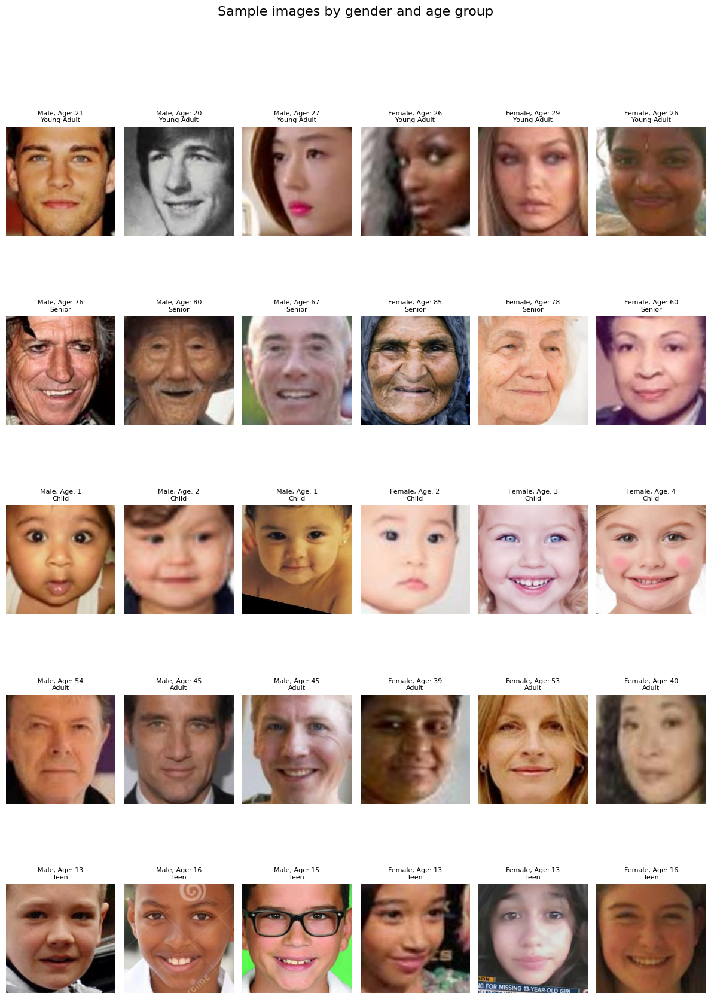

In [ ]:
display_images_by_group(metadata_df, images_per_group=3)

**Checking for the missing data**

In [ ]:
missing_metadata = metadata_df[metadata_df[['age', 'gender']].isnull().any(axis=1)]

In [ ]:
if not missing_metadata.empty:
    print("Images with missing data:")
    print(missing_metadata)
else:
    print("All files have age and gender data.")

All files have age and gender data.


**Checking for duplicated images based MD5 hash**

MD5 hashes can detect exact duplicates – images that are identical in every binary detail.

In [ ]:
def calculate_file_hash(filepath):
    """Calculates the MD5 hash of a file."""
    with open(filepath, 'rb') as file:
        return hashlib.md5(file.read()).hexdigest()

In [ ]:
metadata_df['file_hash'] = metadata_df['file_path'].apply(calculate_file_hash)

In [ ]:
duplicates = metadata_df[metadata_df.duplicated('file_hash', keep=False)]

In [ ]:
if not duplicates.empty:
    print("Duplicate images:")
    print(duplicates[['file_path', 'age', 'gender']])
else:
    print("No duplicated images.")

Duplicate images:
                                               file_path  age  gender
18     /content/UTKFace/UTKFace/2_0_0_201701102253228...    2       0
35     /content/UTKFace/UTKFace/32_1_1_20170112215208...   32       1
74     /content/UTKFace/UTKFace/26_1_2_20170116182201...   26       1
106    /content/UTKFace/UTKFace/26_1_2_20170116180325...   26       1
137    /content/UTKFace/UTKFace/32_0_1_20170113145215...   32       0
...                                                  ...  ...     ...
23406  /content/UTKFace/UTKFace/3_1_0_201701091918239...    3       1
23412  /content/UTKFace/UTKFace/25_0_3_20170119171619...   25       0
23477  /content/UTKFace/UTKFace/26_1_2_20170116180302...   26       1
23505  /content/UTKFace/UTKFace/30_1_0_20170117193827...   30       1
23658  /content/UTKFace/UTKFace/15_1_0_20170109204210...   15       1

[765 rows x 3 columns]


In [ ]:
def display_duplicate_samples(df, num_samples=5):
    duplicate_hashes = df['file_hash'].value_counts().loc[lambda x: x > 1].index[:num_samples]

    fig, axes = plt.subplots(num_samples, 2, figsize=(10, num_samples * 3))
    fig.suptitle("Sample Duplicate Images for Review", fontsize=16)

    for i, file_hash in enumerate(duplicate_hashes):
        duplicate_images = df[df['file_hash'] == file_hash].iloc[:2]

        for j, (_, row) in enumerate(duplicate_images.iterrows()):
            img = mpimg.imread(row['file_path'])
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"Age: {row['age']}, Gender: {'Male' if row['gender'] == 0 else 'Female'}")
            axes[i, j].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

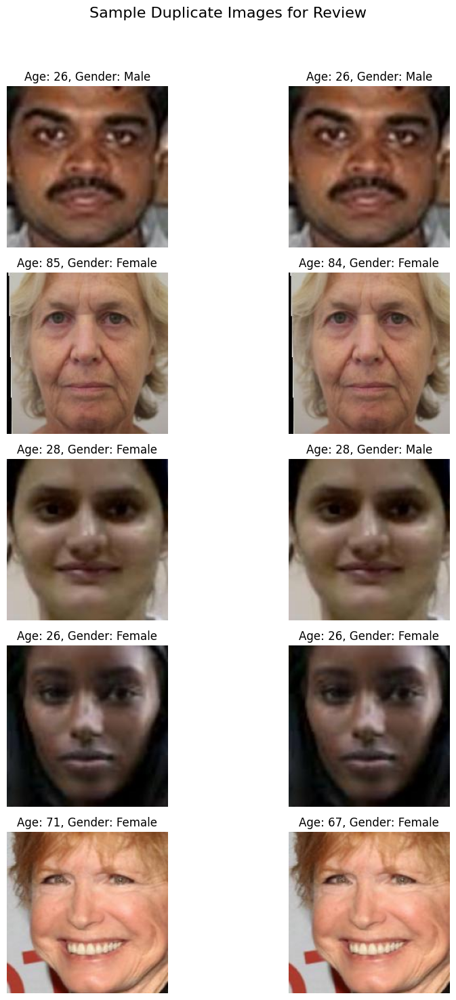

In [ ]:
display_duplicate_samples(duplicates, num_samples=5)

In [ ]:
unique_metadata_df = metadata_df.drop_duplicates(subset='file_hash', keep='first').reset_index(drop=True)

In [ ]:
print("Dataset size:", metadata_df.shape[0])
print("Dataset size after removing duplicates:", unique_metadata_df.shape[0])

Dataset size: 23705
Dataset size after removing duplicates: 23315


In [ ]:
unique_metadata_df.to_csv('/content/unique_metadata.csv', index=False)

**Checking images format, colour model and channels.**

In [ ]:
def get_color_model(filepath):
    with Image.open(filepath) as img:
        return img.mode

metadata_df['color_model'] = metadata_df['file_path'].apply(get_color_model)
print(metadata_df['color_model'].value_counts())

color_model
RGB    23705
Name: count, dtype: int64


In [ ]:
def get_num_channels(filepath):
    with Image.open(filepath) as img:
        return len(img.getbands())

metadata_df['num_channels'] = metadata_df['file_path'].apply(get_num_channels)
print(metadata_df['num_channels'].value_counts())

num_channels
3    23705
Name: count, dtype: int64


In [ ]:
metadata_df['file_format'] = metadata_df['file_path'].apply(lambda x: os.path.splitext(x)[-1].lower())

print("Image format distribution:")
print(metadata_df['file_format'].value_counts())

Image format distribution:
file_format
.jpg    23705
Name: count, dtype: int64


**Age and Gender distributions**

In [ ]:
gender_counts_normalized = unique_metadata_df['gender'].value_counts(normalize=True)

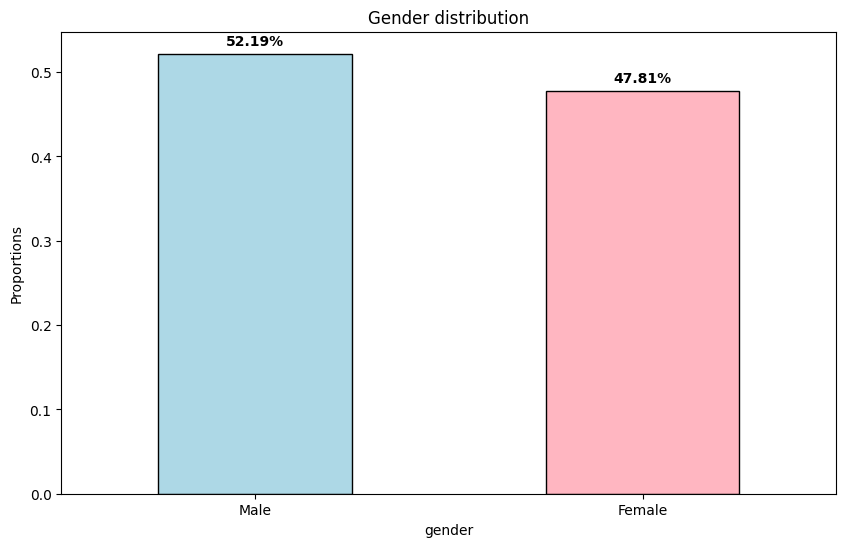

In [ ]:
plt.figure(figsize=(10, 6))
ax = gender_counts_normalized.plot(kind='bar',
                                   color=['lightblue', 'lightpink'],
                                   edgecolor='black')
plt.title("Gender distribution")
plt.xticks([0, 1], ["Male", "Female"], rotation=0)
plt.ylabel("Proportions")

for i, v in enumerate(gender_counts_normalized):
    ax.text(i, v + 0.01, f"{v:.2%}", ha='center', fontweight='bold')

plt.show()

*Female* group is a bit less represented in the set. Might create slight sample bias. We will try to address this once training the model.

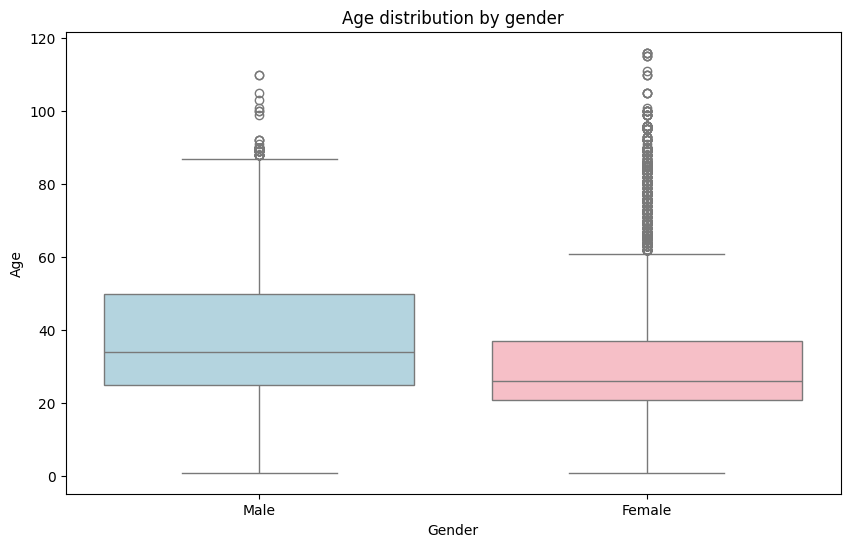

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='gender',
            y='age',
            hue='gender',
            data=unique_metadata_df,
            palette=['lightblue', 'lightpink'],
            dodge=False,
            legend=False)
plt.xticks([0, 1], ["Male", "Female"])
plt.title("Age distribution by gender")
plt.xlabel("Gender")
plt.ylabel("Age")
plt.show()

Outliers above age 60 for females suggests that most females in the dataset are younger with fewer older individuals represented. For males outliers only start from almost 90 years old. Males age distribution looks a bit closer to the normal distibution. Given how we have less females images and less senior females images there might be issues how model will be able to model this group.


In [ ]:
class_balance = unique_metadata_df.groupby(['age_group', 'gender']).size().unstack(fill_value=0)

<Figure size 1000x600 with 0 Axes>

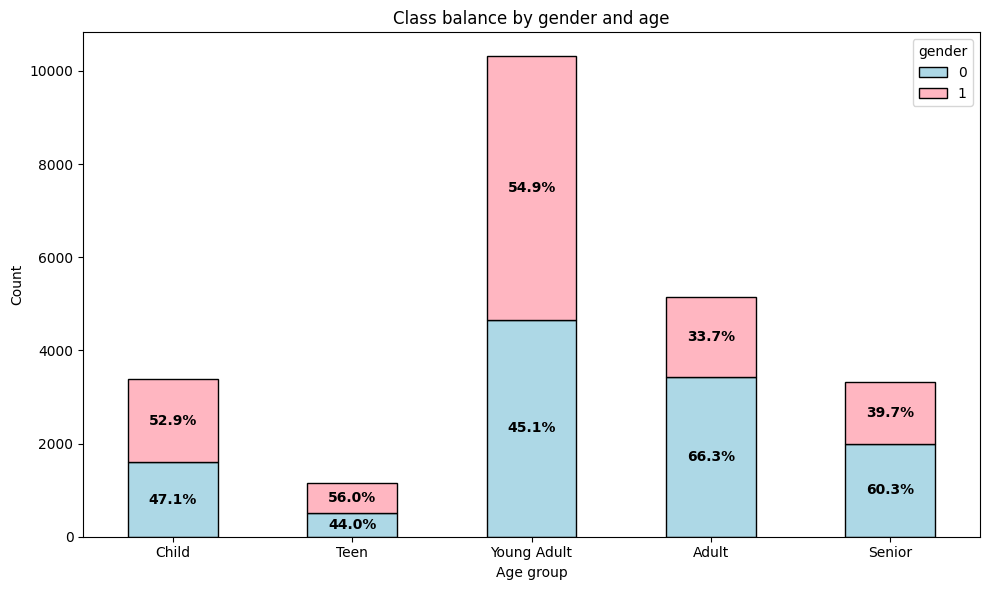

In [ ]:
plt.figure(figsize=(10, 6))
ax = class_balance.plot(kind='bar',
                        stacked=True,
                        figsize=(10, 6),
                        color=['lightblue', 'lightpink'],
                        edgecolor='black')
plt.title("Class balance by gender and age")
plt.ylabel("Count")
plt.xlabel("Age group")
plt.xticks(rotation=0)
total_counts = class_balance.sum(axis=1)

for age_idx, (age_group, row) in enumerate(class_balance.iterrows()):
    for gender_idx, count in enumerate(row):
        proportion = count / total_counts[age_group]
        ax.text(age_idx,
                row.cumsum()[gender_idx] - count / 2, f"{proportion:.1%}",
                ha="center",
                va="center",
                fontweight="bold")
plt.tight_layout()
plt.show()

Here we can see where potentially younger female individuals appear as outliers in their individual gender distributions. We can see that Adult and Senior individuals groups are highly imbalanaced when it comes to gender. Other groups are less imbalanced are have more females image samples.

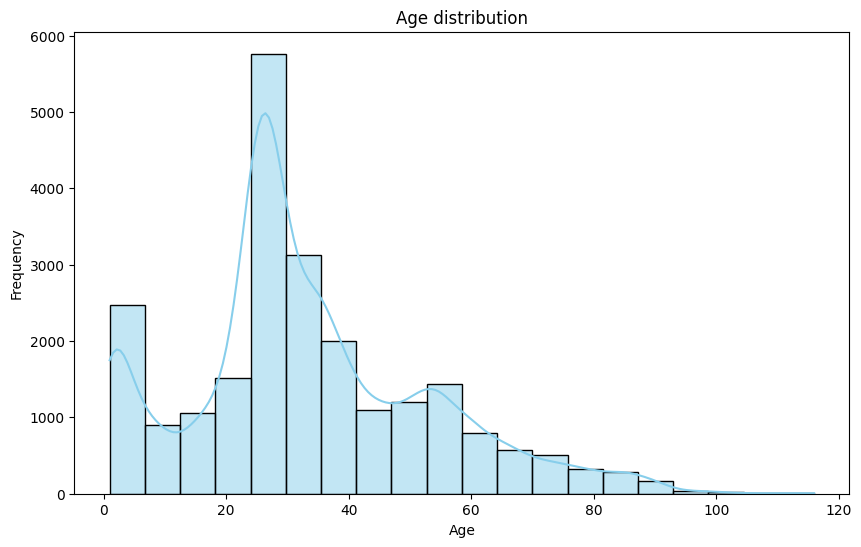

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(unique_metadata_df['age'],
             bins=20,
             kde=True,
             color='skyblue',
             edgecolor='black')
plt.title("Age distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.show()

The age distribution in the dataset is heavily skewed toward younger individuals, with a highest peak around 20 years old and a secondary peak in early childhood. Representation gradually declines with age, with very few samples for individuals over 60, indicating potential challenges in accurately predicting features for older age groups. This imbalance suggests the model may perform better on younger individuals, with a possible bias toward this demographic due to the limited data for older ages.

**Closer look at the individuals in the set that are 100 years and older.**

In [ ]:
centenarians_df = unique_metadata_df[unique_metadata_df['age'] >= 100]

In [ ]:
num_images = len(centenarians_df)
images_per_row = 3
num_rows = math.ceil(num_images / images_per_row)

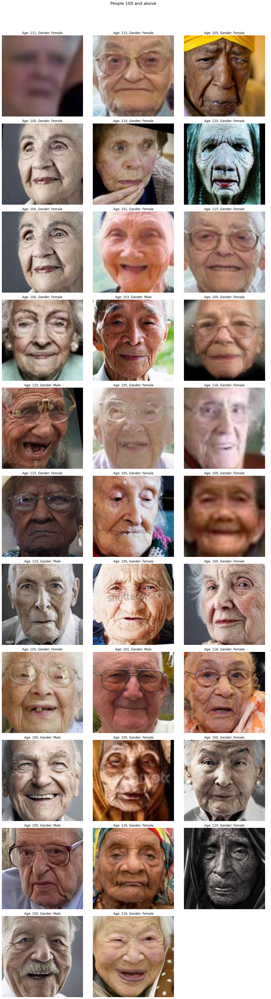

In [ ]:
fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, 5 * num_rows))
fig.suptitle("People 100 and above", fontsize=16)
axes = axes.flatten()

for i, (_, row) in enumerate(centenarians_df.iterrows()):
    img = mpimg.imread(row['file_path'])
    axes[i].imshow(img)
    axes[i].set_title(f"Age: {row['age']}, Gender: {'Male' if row['gender'] == 0 else 'Female'}")
    axes[i].axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

We can see that those extreme outliers are thruthfull and we do have in our data set represented people over 100 year, however we were able to notice that there are more duplicated pictures that are slightly different from each other, could be a product of data augmentation. However there is an indication that that there might be more issue with the data. We will try use perceptual hash to see what kind pictures are near duplicated.

In [ ]:
def calculate_phash(filepath):
    with Image.open(filepath) as img:
        return str(imagehash.phash(img))  #perceptual hash

unique_metadata_df['phash'] = unique_metadata_df['file_path'].apply(calculate_phash)
duplicate_phash_df = unique_metadata_df[unique_metadata_df.duplicated('phash', keep=False)]

print(duplicate_phash_df[['file_path', 'age', 'gender', 'phash']])

                                               file_path  age  gender  \
0      /content/UTKFace/UTKFace/23_1_2_20170116173110...   23       1   
69     /content/UTKFace/UTKFace/42_0_1_20170116194444...   42       0   
99     /content/UTKFace/UTKFace/28_0_1_20170113150754...   28       0   
152    /content/UTKFace/UTKFace/65_1_0_20170110133937...   65       1   
153    /content/UTKFace/UTKFace/24_0_0_20170104004125...   24       0   
...                                                  ...  ...     ...   
23131  /content/UTKFace/UTKFace/29_0_0_20170119195323...   29       0   
23202  /content/UTKFace/UTKFace/18_1_4_20170103224632...   18       1   
23207  /content/UTKFace/UTKFace/54_0_0_20170117191403...   54       0   
23224  /content/UTKFace/UTKFace/26_0_3_20170119183158...   26       0   
23291  /content/UTKFace/UTKFace/1_0_0_201701091942325...    1       0   

                  phash  
0      80560dd2978f7e1e  
69     94a02a92d3c97d6f  
99     adc85287c3cce467  
152    d2940b8297d6

In [ ]:
num_groups_to_display = 5
displayed_groups = 0
duplicate_groups = duplicate_phash_df.groupby('phash')

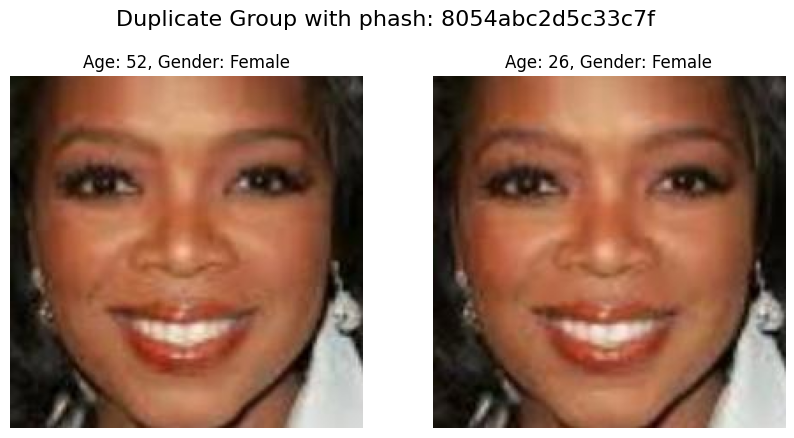

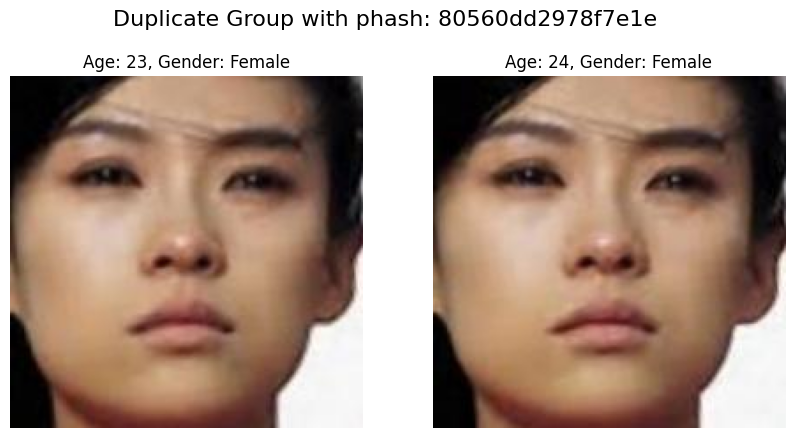

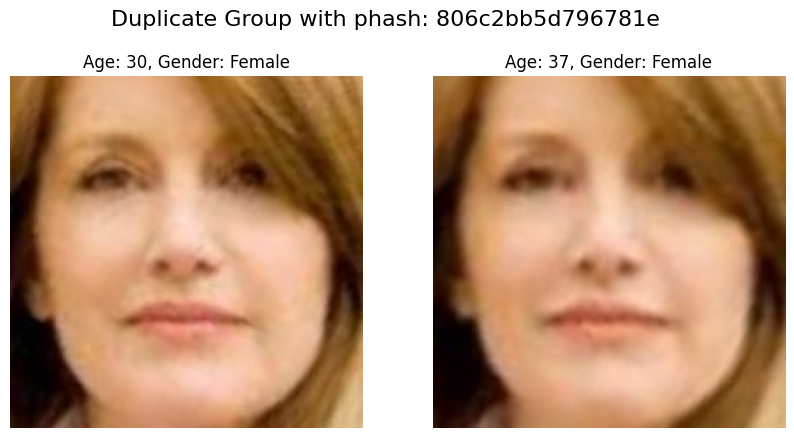

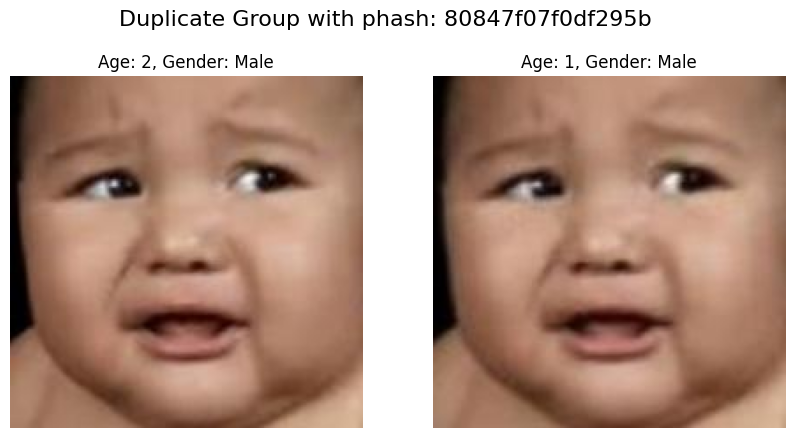

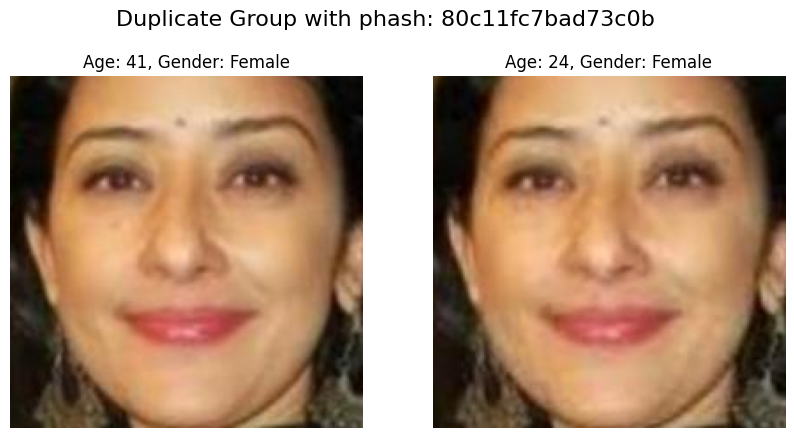

In [ ]:
for phash, group in duplicate_groups:
    if displayed_groups >= num_groups_to_display:
        break

    file_paths = group['file_path'].values
    num_images = len(file_paths)

    fig, axes = plt.subplots(1, num_images, figsize=(5 * num_images, 5))
    fig.suptitle(f"Duplicate Group with phash: {phash}", fontsize=16)

    for i, file_path in enumerate(file_paths):
        img = Image.open(file_path)
        axes[i].imshow(img)
        axes[i].set_title(f"Age: {group.iloc[i]['age']}, Gender: {'Male' if group.iloc[i]['gender'] == 0 else 'Female'}")
        axes[i].axis('off')

    plt.show()
    displayed_groups += 1

From these duplicated results we can see cases that might be particulary confusing to the model. For example first case shows there is almost identical picture showing 2 different age values, following cases are alike. This shows that there might inconsistent labelling done to the images.

In [ ]:
unique_duplicate_groups = duplicate_phash_df['phash'].nunique()
print(f"Number of unique duplicate groups: {unique_duplicate_groups}")

Number of unique duplicate groups: 221


so we have 450 images that are part of 221 duplicate groups. If we didn't have time constrains we could review each case seperately and possibly correct the data, but right now we will just delete these images.

In [ ]:
cleaned_metadata_df = unique_metadata_df.drop_duplicates(subset='phash', keep=False)

In [ ]:
print("Dataset size after second duplicates removal:", cleaned_metadata_df.shape[0])

Dataset size after second duplicates removal: 22865


In [ ]:
def calculate_aspect_ratio(filepath):
    with Image.open(filepath) as img:
        width, height = img.size
        return width / height

In [ ]:
cleaned_metadata_df.loc[:, 'aspect_ratio'] = cleaned_metadata_df['file_path'].apply(calculate_aspect_ratio)

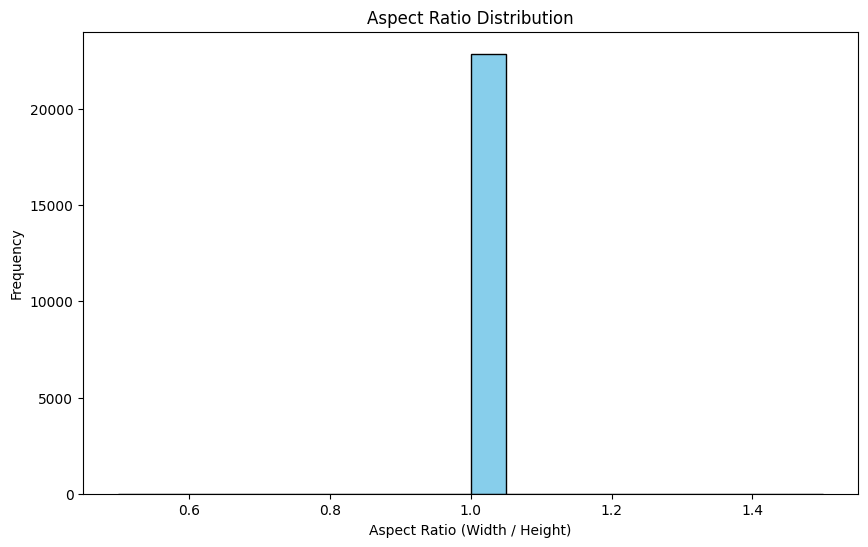

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(cleaned_metadata_df['aspect_ratio'], bins=20, color='skyblue', edgecolor='black')
plt.title("Aspect Ratio Distribution")
plt.xlabel("Aspect Ratio (Width / Height)")
plt.ylabel("Frequency")
plt.show()

In [ ]:
def get_dimensions(filepath):
    with Image.open(filepath) as img:
        return img.size

In [ ]:
cleaned_metadata_df[['width', 'height']] = cleaned_metadata_df['file_path'].apply(get_dimensions).apply(pd.Series)

In [ ]:
unique_widths = cleaned_metadata_df['width'].unique()
unique_heights = cleaned_metadata_df['height'].unique()

print(f"Unique widths: {unique_widths}")
print(f"Unique heights: {unique_heights}")

Unique widths: [200]
Unique heights: [200]


<ipython-input-45-4097ea63ac9b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df[['width', 'height']] = cleaned_metadata_df['file_path'].apply(get_dimensions).apply(pd.Series)
<ipython-input-45-4097ea63ac9b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df[['width', 'height']] = cleaned_metadata_df['file_path'].apply(get_dimensions).apply(pd.Series)


In [ ]:
dimension_counts = cleaned_metadata_df.groupby(['width', 'height']).size()
print("\nCount of each width-height pair:")
print(dimension_counts)


Count of each width-height pair:
width  height
200    200       22865
dtype: int64


We can at least be certian that images are uniformaly sized 200x200 pixels.

In [ ]:
def calculate_rgb_means(filepath):
    with Image.open(filepath) as img:
        img_array = np.array(img)
        return img_array.mean(axis=(0, 1))

In [ ]:
cleaned_metadata_df[['mean_R', 'mean_G', 'mean_B']] = cleaned_metadata_df['file_path'].apply(calculate_rgb_means).apply(pd.Series)

In [ ]:
overall_mean_R = cleaned_metadata_df['mean_R'].mean()
overall_mean_G = cleaned_metadata_df['mean_G'].mean()
overall_mean_B = cleaned_metadata_df['mean_B'].mean()
print(f"Overall Mean R: {overall_mean_R:.2f}, G: {overall_mean_G:.2f}, B: {overall_mean_B:.2f}")

Overall Mean R: 152.07, G: 116.46, B: 99.71


<ipython-input-48-09c6d86be5ab>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df[['mean_R', 'mean_G', 'mean_B']] = cleaned_metadata_df['file_path'].apply(calculate_rgb_means).apply(pd.Series)
<ipython-input-48-09c6d86be5ab>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df[['mean_R', 'mean_G', 'mean_B']] = cleaned_metadata_df['file_path'].apply(calculate_rgb_means).apply(pd.Series)
<ipython-input-48-09c6d86be5ab>:1: SettingWithCopyWarning: 
A value is trying to be set 

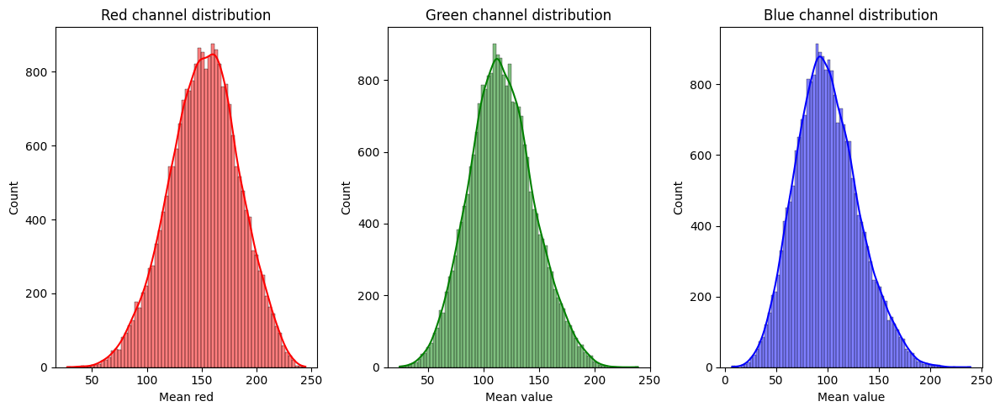

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
sns.histplot(cleaned_metadata_df['mean_R'], color='red', kde=True)
plt.title("Red channel distribution")
plt.xlabel("Mean red")

plt.subplot(1, 3, 2)
sns.histplot(cleaned_metadata_df['mean_G'], color='green', kde=True)
plt.title("Green channel distribution")
plt.xlabel("Mean value")

plt.subplot(1, 3, 3)
sns.histplot(cleaned_metadata_df['mean_B'], color='blue', kde=True)
plt.title("Blue channel distribution")
plt.xlabel("Mean value")

plt.tight_layout()
plt.show()

The dataset has a warm color bias due to a highest mean in the red channel, which can be typical for human face images. This bias could influence model learning but is likely beneficial in a facial recognition, where natural skin tones are expected.

<ipython-input-50-938165a5b6a5>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='gender', y='mean_R', data=cleaned_metadata_df, palette=['lightblue', 'lightpink'])


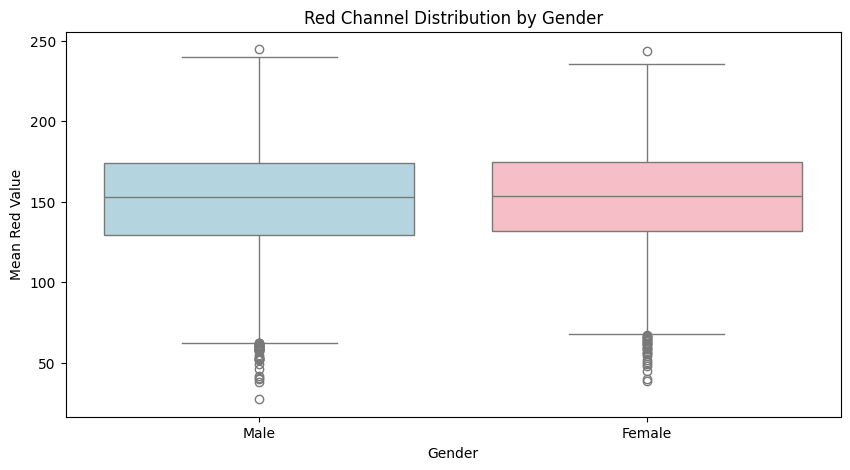

<ipython-input-50-938165a5b6a5>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='gender', y='mean_G', data=cleaned_metadata_df, palette=['lightblue', 'lightpink'])


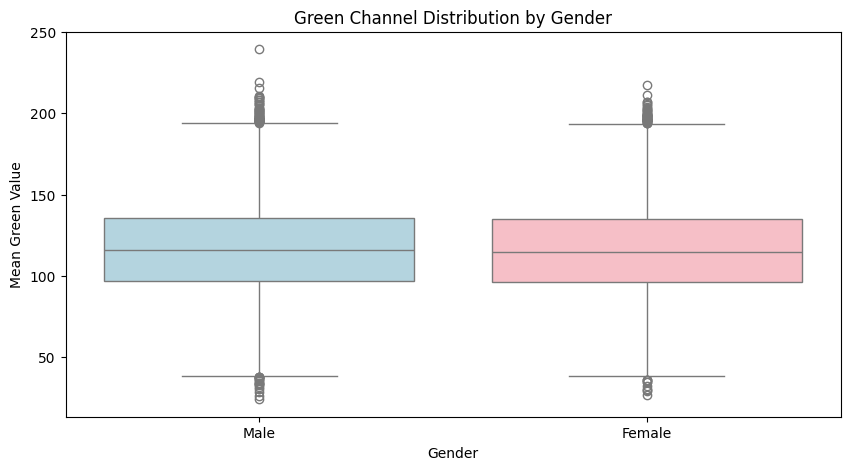

<ipython-input-50-938165a5b6a5>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='gender', y='mean_B', data=cleaned_metadata_df, palette=['lightblue', 'lightpink'])


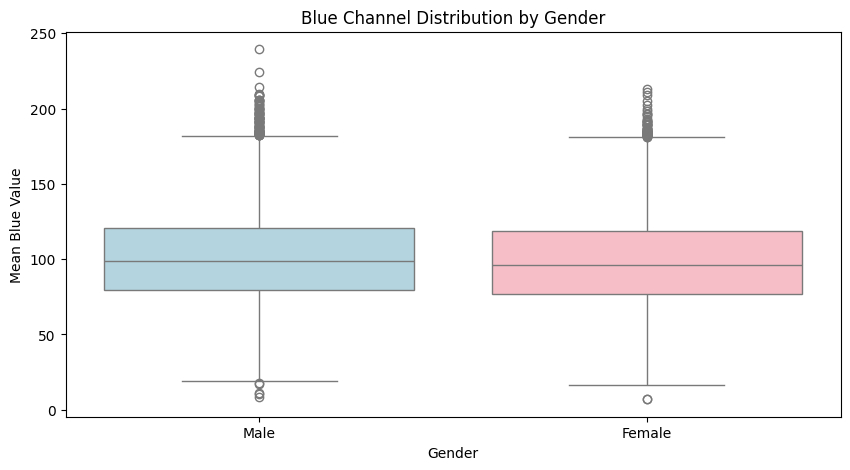

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='gender', y='mean_R', data=cleaned_metadata_df, palette=['lightblue', 'lightpink'])
plt.title("Red Channel Distribution by Gender")
plt.xlabel("Gender")
plt.ylabel("Mean Red Value")
plt.xticks([0, 1], ["Male", "Female"])
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='gender', y='mean_G', data=cleaned_metadata_df, palette=['lightblue', 'lightpink'])
plt.title("Green Channel Distribution by Gender")
plt.xlabel("Gender")
plt.ylabel("Mean Green Value")
plt.xticks([0, 1], ["Male", "Female"])
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='gender', y='mean_B', data=cleaned_metadata_df, palette=['lightblue', 'lightpink'])
plt.title("Blue Channel Distribution by Gender")
plt.xlabel("Gender")
plt.ylabel("Mean Blue Value")
plt.xticks([0, 1], ["Male", "Female"])
plt.show()

All three channels show similar distributions between males and females, with only minor differences in variability.

The close alignment between genders in color channels indicates that the dataset is balanced in terms of color distribution, reducing the risk of unintended gender-related bias based on color characteristics.

Each channel has some outliers suggesting a few images may have distinct lighting conditions or backgrounds.

<ipython-input-51-c3079ab4fa75>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='age_group', y='mean_R', data=cleaned_metadata_df, palette='viridis')


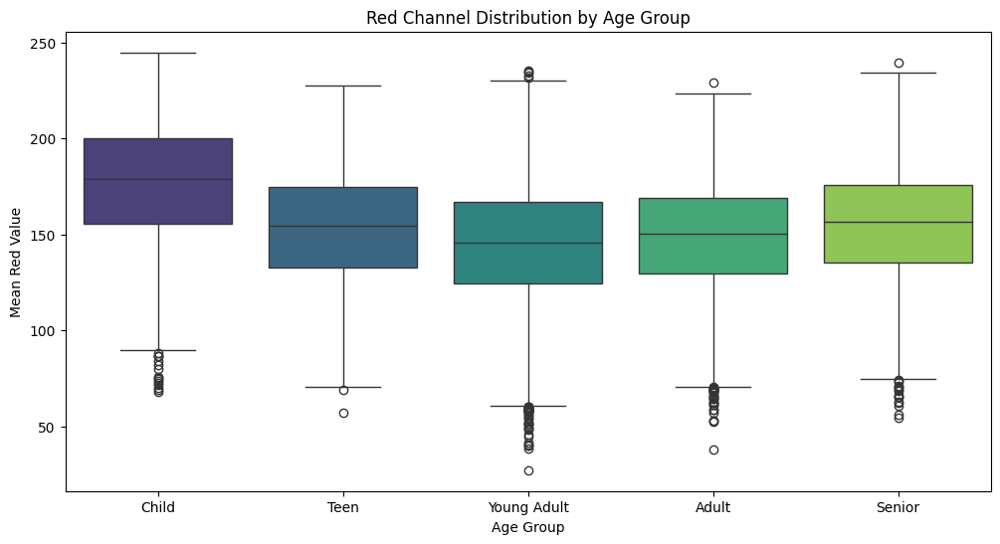

<ipython-input-51-c3079ab4fa75>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='age_group', y='mean_G', data=cleaned_metadata_df, palette='viridis')


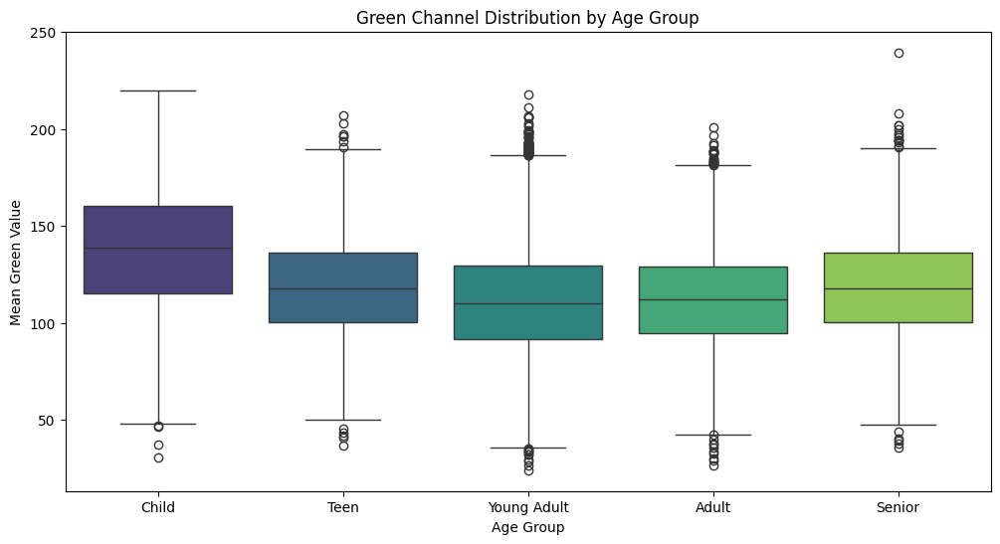

<ipython-input-51-c3079ab4fa75>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='age_group', y='mean_B', data=cleaned_metadata_df, palette='viridis')


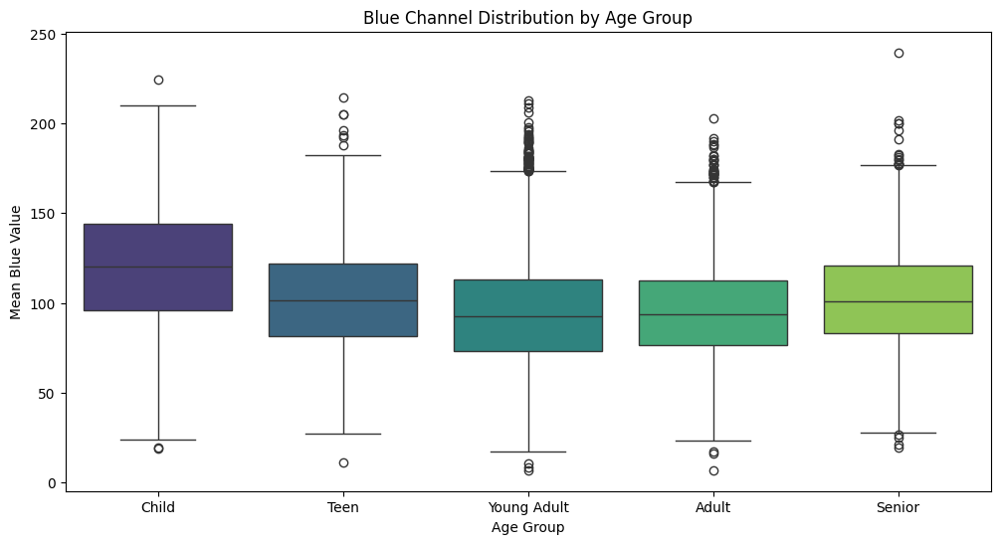

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='age_group', y='mean_R', data=cleaned_metadata_df, palette='viridis')
plt.title("Red Channel Distribution by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Mean Red Value")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='age_group', y='mean_G', data=cleaned_metadata_df, palette='viridis')
plt.title("Green Channel Distribution by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Mean Green Value")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='age_group', y='mean_B', data=cleaned_metadata_df, palette='viridis')
plt.title("Blue Channel Distribution by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Mean Blue Value")
plt.show()

RGB channel distributions reveals that the Child age group consistently has brighter images with higher median RGB intensities compared to other groups, possibly due to lighting or preprocessing differences.

In [ ]:
def is_rgb_but_grayscale(filepath):
    """Checks if an RGB image is actually grayscale by comparing R, G, and B channels."""
    with Image.open(filepath) as img:
        img_array = np.array(img)
        return np.all(img_array[:,:,0] == img_array[:,:,1]) and np.all(img_array[:,:,1] == img_array[:,:,2])

In [ ]:
cleaned_metadata_df['rgb_but_grayscale'] = cleaned_metadata_df['file_path'].apply(is_rgb_but_grayscale)

<ipython-input-53-654b77f943ec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df['rgb_but_grayscale'] = cleaned_metadata_df['file_path'].apply(is_rgb_but_grayscale)


In [ ]:
def display_grayscale(df, num_samples=20, rows=4, cols=5):
    """
    Displays a grid of images that appear grayscale.

    Arguments:
        df: The data frame.
        num_samples: Number of images to display.
        rows: Number of rows for the grid.
        cols: Number of columns for the grid.
    """
    grayscale_rgb_df = df[df['rgb_but_grayscale']]
    samples = grayscale_rgb_df.sample(min(num_samples, len(grayscale_rgb_df)))

    fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
    fig.suptitle("Images that appear grayscale", fontsize=16)

    for i, (ax, (_, row)) in enumerate(zip(axes.flatten(), samples.iterrows())):
        img = mpimg.imread(row['file_path'])
        ax.imshow(img)
        gender = "Male" if row['gender'] == 0 else "Female"
        ax.set_title(f"Age: {row['age']}, Gender: {gender}")
        ax.axis('off')

    for ax in axes.flatten()[len(samples):]:
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

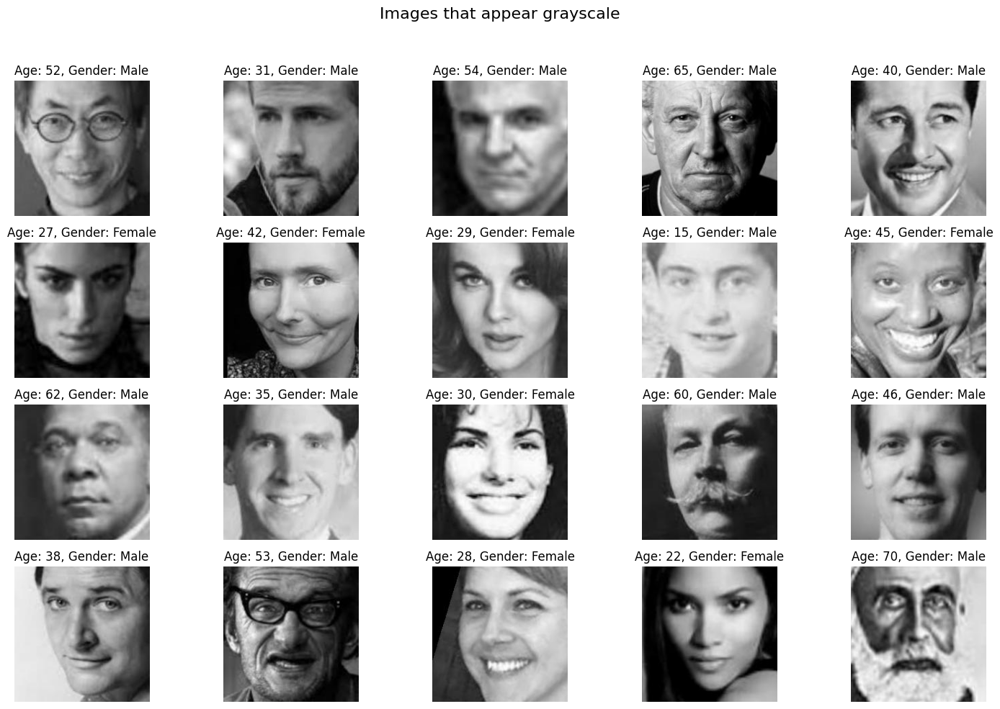

In [ ]:
display_grayscale(cleaned_metadata_df, num_samples=20, rows=4, cols=5)

In [ ]:
grayscale_gender_proportion = cleaned_metadata_df.groupby('gender')['rgb_but_grayscale'].mean()

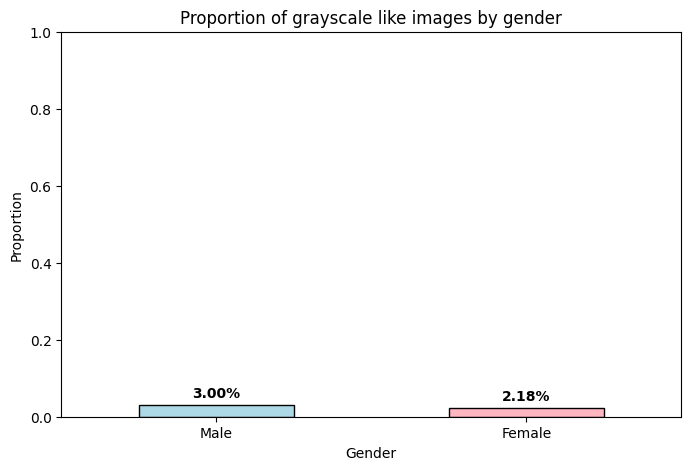

In [ ]:
plt.figure(figsize=(8, 5))
grayscale_gender_proportion.plot(kind='bar', color=['lightblue', 'lightpink'], edgecolor='black')
plt.title("Proportion of grayscale like images by gender")
plt.xlabel("Gender")
plt.ylabel("Proportion")
plt.xticks([0, 1], ["Male", "Female"], rotation=0)
plt.ylim(0, 1)

for i, v in enumerate(grayscale_gender_proportion):
    plt.text(i, v + 0.02, f"{v:.2%}", ha='center', fontweight='bold')

plt.show()

In [ ]:
grayscale_age_proportion = cleaned_metadata_df.groupby('age_group')['rgb_but_grayscale'].mean()

<ipython-input-58-1fb9447b3bcf>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grayscale_age_proportion = cleaned_metadata_df.groupby('age_group')['rgb_but_grayscale'].mean()


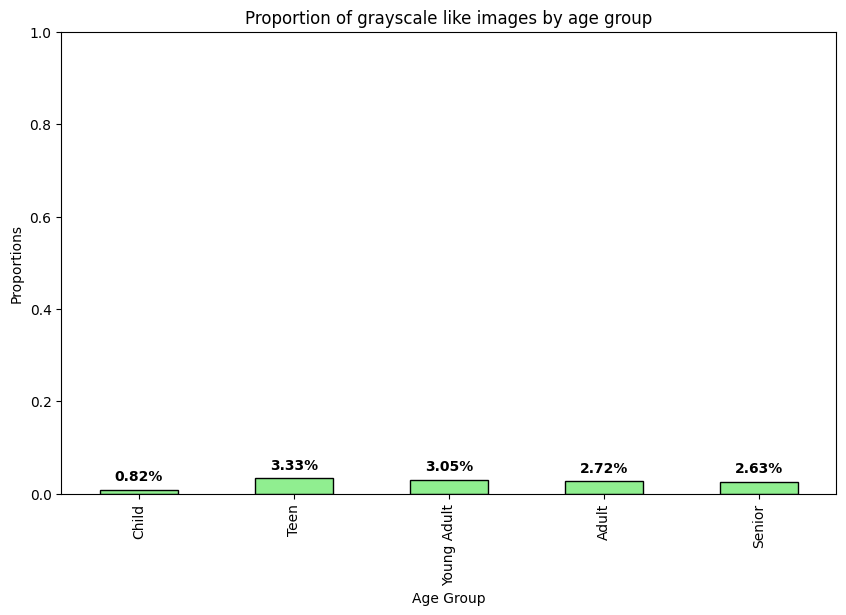

In [ ]:
plt.figure(figsize=(10, 6))
grayscale_age_proportion.plot(kind='bar', color='lightgreen', edgecolor='black')
plt.title("Proportion of grayscale like images by age group")
plt.xlabel("Age Group")
plt.ylabel("Proportions")
plt.ylim(0, 1)
for i, v in enumerate(grayscale_age_proportion):
    plt.text(i, v + 0.02, f"{v:.2%}", ha='center', fontweight='bold')

plt.show()

There are not a lot images that are like greyscale images. At this moment we are not going to do anythig about them as in real life cases greyscale images could be presented to the model and since greyscale images appear in each group almost proportianaly we consider this at the moment not an issue.

In [ ]:
def brightness_contrast(filepath):
    with Image.open(filepath).convert("L") as img:
        img_array = np.array(img)
        brightness = img_array.mean()
        contrast = img_array.std()
        return brightness, contrast

In [ ]:
cleaned_metadata_df[['brightness', 'contrast']] = cleaned_metadata_df['file_path'].apply(brightness_contrast).apply(pd.Series)

<ipython-input-61-fb964dca6ba6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df[['brightness', 'contrast']] = cleaned_metadata_df['file_path'].apply(brightness_contrast).apply(pd.Series)
<ipython-input-61-fb964dca6ba6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df[['brightness', 'contrast']] = cleaned_metadata_df['file_path'].apply(brightness_contrast).apply(pd.Series)


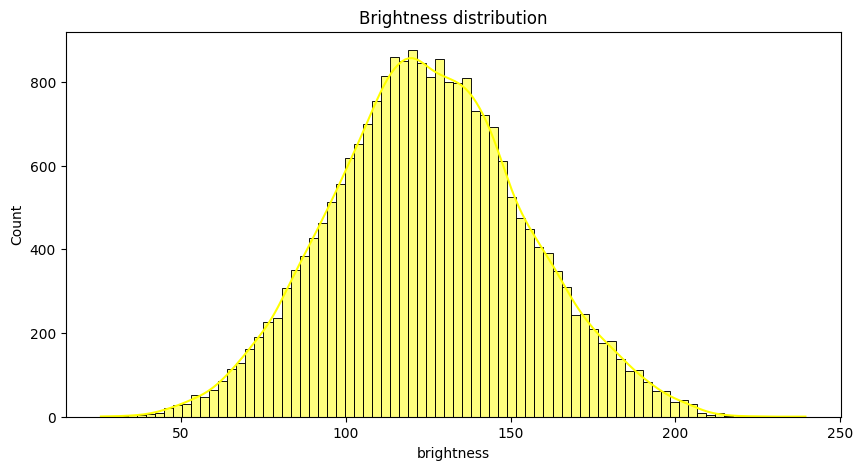

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(cleaned_metadata_df['brightness'], kde=True, color='yellow')
plt.title("Brightness distribution")
plt.show()

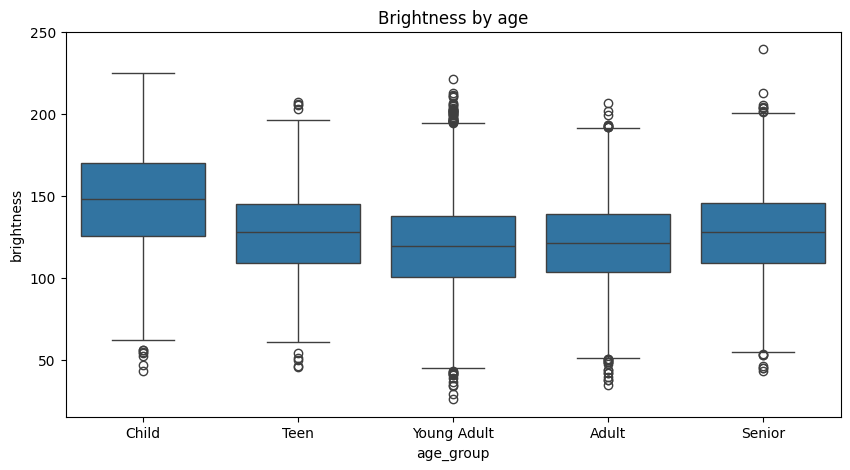

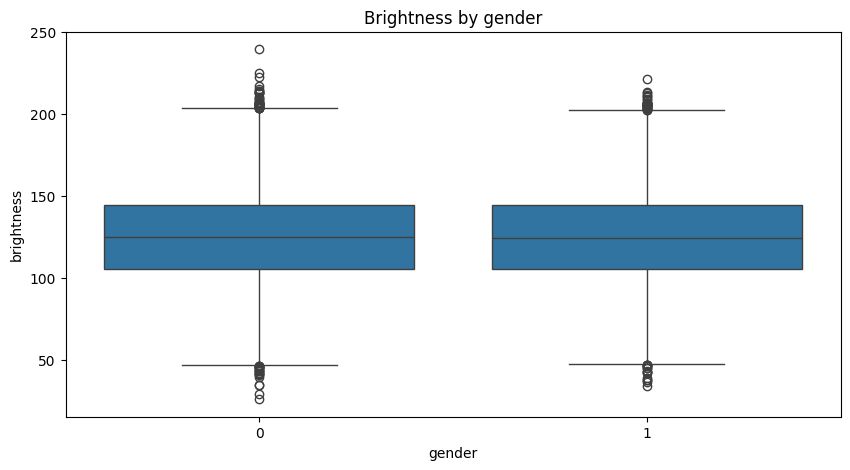

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='age_group', y='brightness', data=cleaned_metadata_df)
plt.title("Brightness by age")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='gender', y='brightness', data=cleaned_metadata_df)
plt.title("Brightness by gender")
plt.show()

While gender appears well balanced in terms of brightness, minor brightness differences across age groups are visible of course similar to what we have seen with RGB distributions of each age group.

In [ ]:
def calculate_sharpness(filepath):
    with Image.open(filepath) as img:
        img_gray = img.convert("L")
        edges = img_gray.filter(ImageFilter.FIND_EDGES)
        return np.array(edges).var()

In [ ]:
cleaned_metadata_df['sharpness'] = cleaned_metadata_df['file_path'].apply(calculate_sharpness)

<ipython-input-67-32164eb035dd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_metadata_df['sharpness'] = cleaned_metadata_df['file_path'].apply(calculate_sharpness)


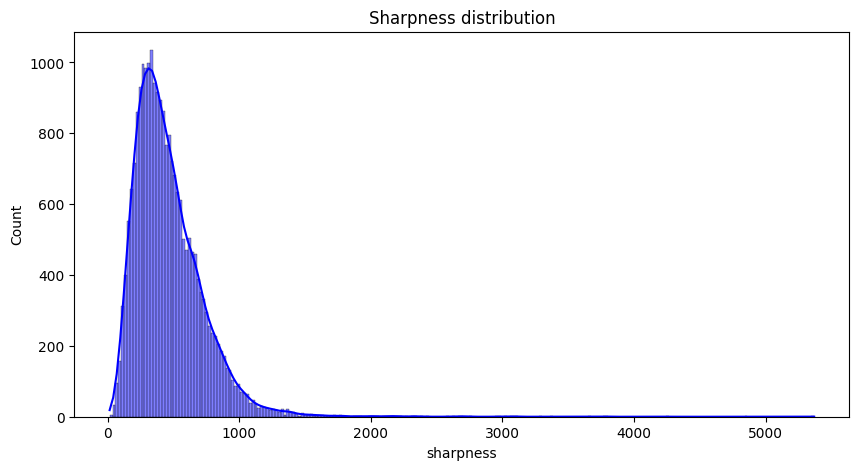

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(cleaned_metadata_df['sharpness'], kde=True, color='blue')
plt.title("Sharpness distribution")
plt.show()

This sharpness distribution plot shows a strong right skew with the majority of images having low to moderate sharpness values and only a few images exhibiting high sharpness levels with a peak between approximately 0 and 500. This suggests that the majority of images are not very sharp possibly because of a  low resolution.

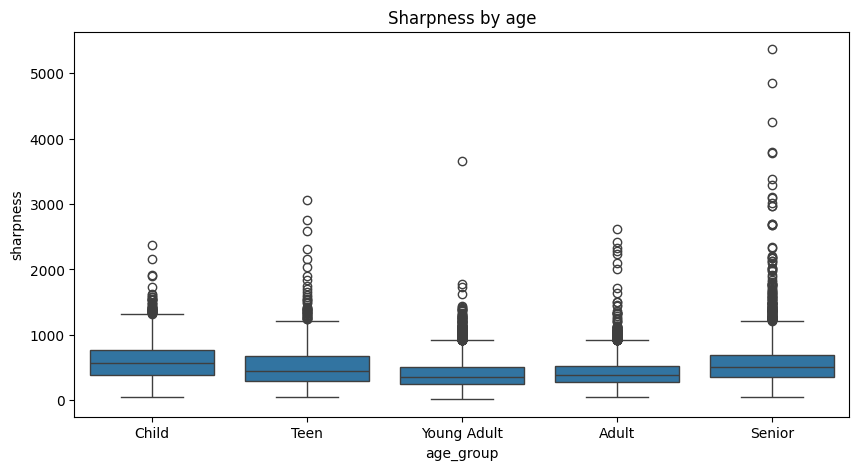

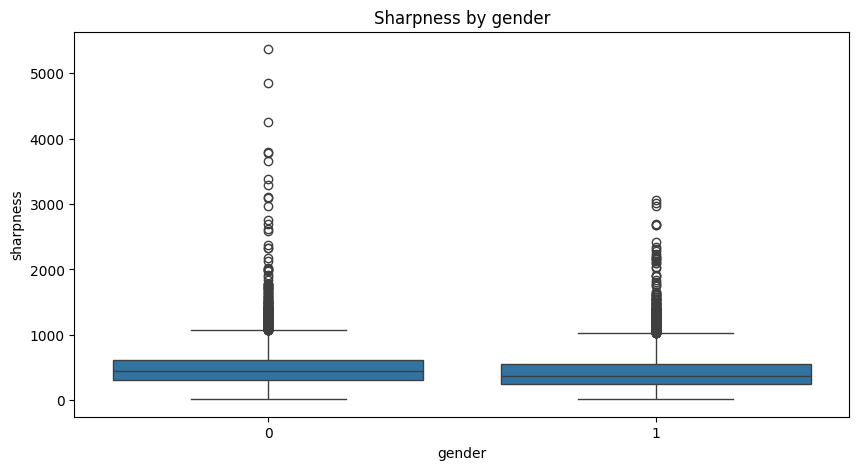

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='age_group', y='sharpness', data=cleaned_metadata_df)
plt.title("Sharpness by age")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='gender', y='sharpness', data=cleaned_metadata_df)
plt.title("Sharpness by gender")
plt.show()

The increasing number of outliers with higher sharpness values among older age groups suggests that image capturing conditions for seniors might introduce some variability.

Gender does not appear to influence sharpness as the distributions are similiar.

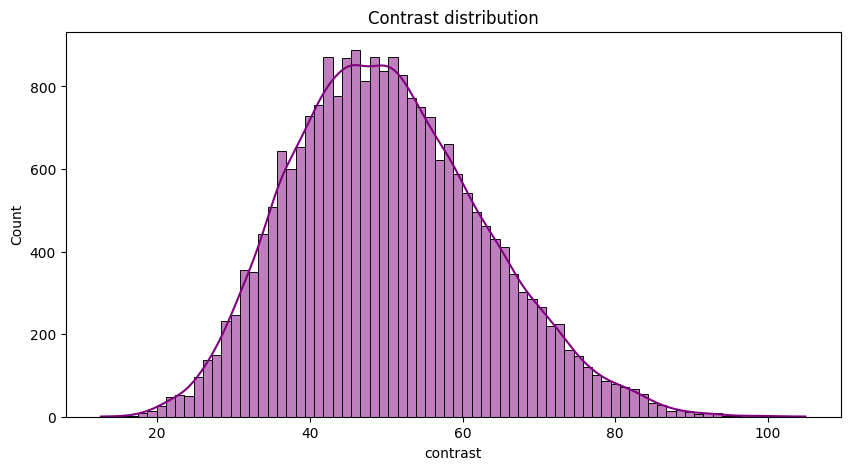

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(cleaned_metadata_df['contrast'], kde=True, color='purple')
plt.title("Contrast distribution")
plt.show()

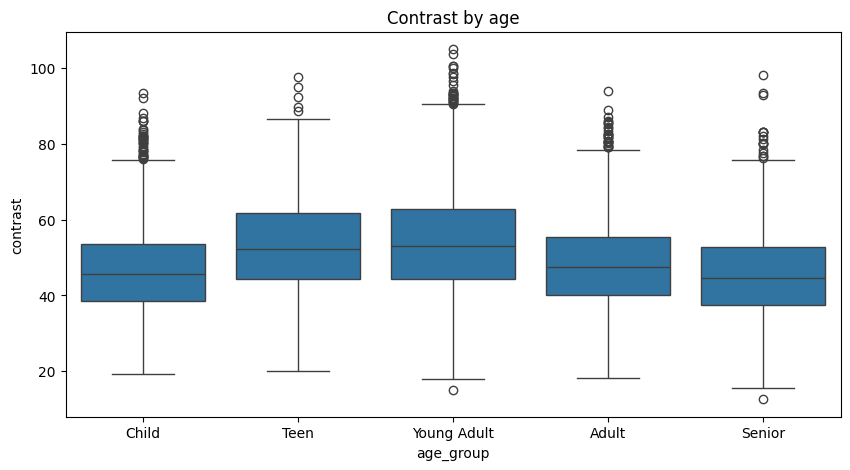

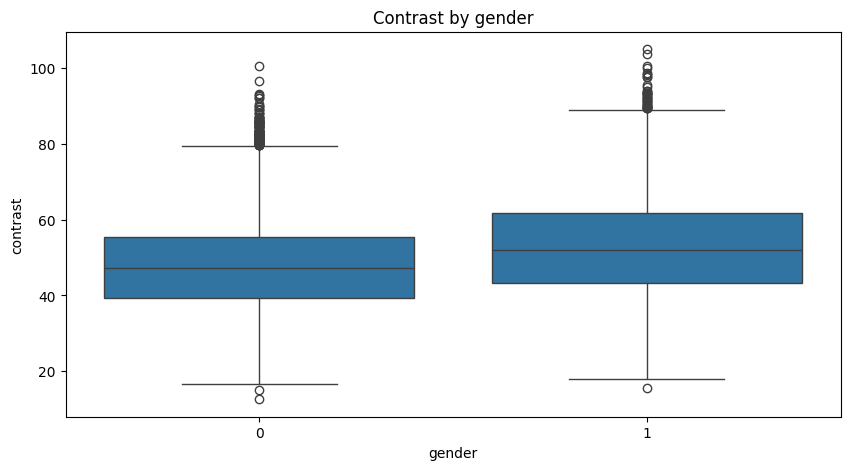

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='age_group', y='contrast', data=cleaned_metadata_df)
plt.title("Contrast by age")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='gender', y='contrast', data=cleaned_metadata_df)
plt.title("Contrast by gender")
plt.show()

This reveals some differences in contrast across age groups and between genders. Among the reviewed feature distributions contrast exhibits the greatest variability mostly in relation to gender.

**Understanding race distribution of images available**

In [ ]:
race_gender_counts = cleaned_metadata_df.groupby(['race', 'gender']).size().unstack(fill_value=0)
race_totals = race_gender_counts.sum(axis=1)
dataset_total = race_totals.sum()

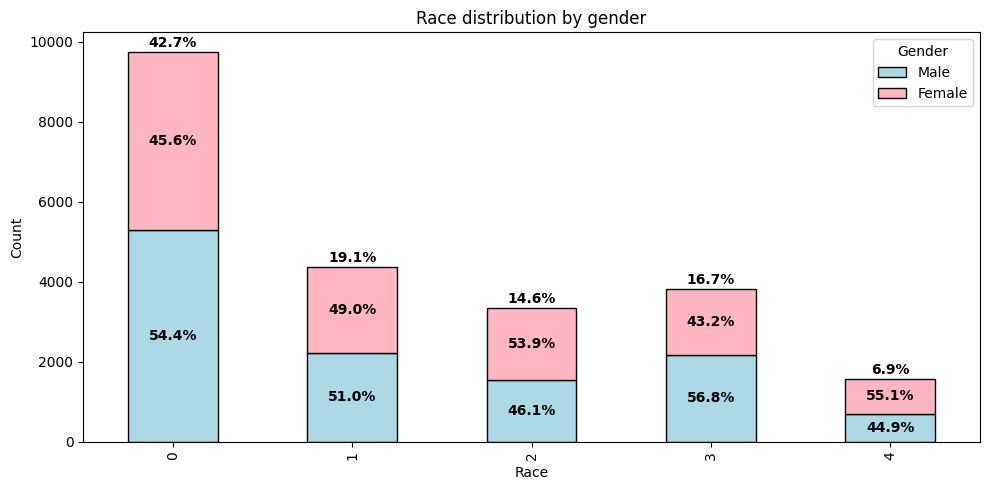

In [ ]:
ax = race_gender_counts.plot(kind='bar', stacked=True, color=['lightblue', 'lightpink'], edgecolor='black', figsize=(10, 5))
plt.title("Race distribution by gender")
plt.xlabel("Race")
plt.ylabel("Count")
plt.legend(["Male", "Female"], title="Gender")

for race_idx, (race, row) in enumerate(race_gender_counts.iterrows()):
    total = race_totals[race]
    for gender_idx, count in enumerate(row):
        proportion = count / total
        ax.text(race_idx,
                row.cumsum()[gender_idx] - count / 2,
                f"{proportion:.1%}",
                ha="center",
                va="center",
                fontweight="bold",
                color="black")

for race_idx, total in enumerate(race_totals):
    dataset_proportion = total / dataset_total
    ax.text(race_idx,
            total + 50,
            f"{dataset_proportion:.1%}",
            ha="center",
            va="bottom",
            fontweight="bold",
            color="black")

plt.tight_layout()
plt.show()

We can see a lot of information here. Most importantly we can see that we have highly imbalanced images set when it come to race representation, we have ~43% white race individuals pictures, ~19% - black, ~15% - asian, ~17% - indian and only ~7 of other (Hispanic, Latino, Middle Eastern).

This visualization reveals an imbalance in the racial representation within the dataset, which could introduce unintended biases in the model, even though the primary task is age and gender classification.

In [ ]:
race_age_counts = cleaned_metadata_df.groupby(['race', 'age_group']).size().unstack(fill_value=0)

<ipython-input-72-cc7ea6599084>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  race_age_counts = cleaned_metadata_df.groupby(['race', 'age_group']).size().unstack(fill_value=0)


<ipython-input-73-e53dd347b747>:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.text(race_idx, row.cumsum()[age_group_idx] - count / 2,


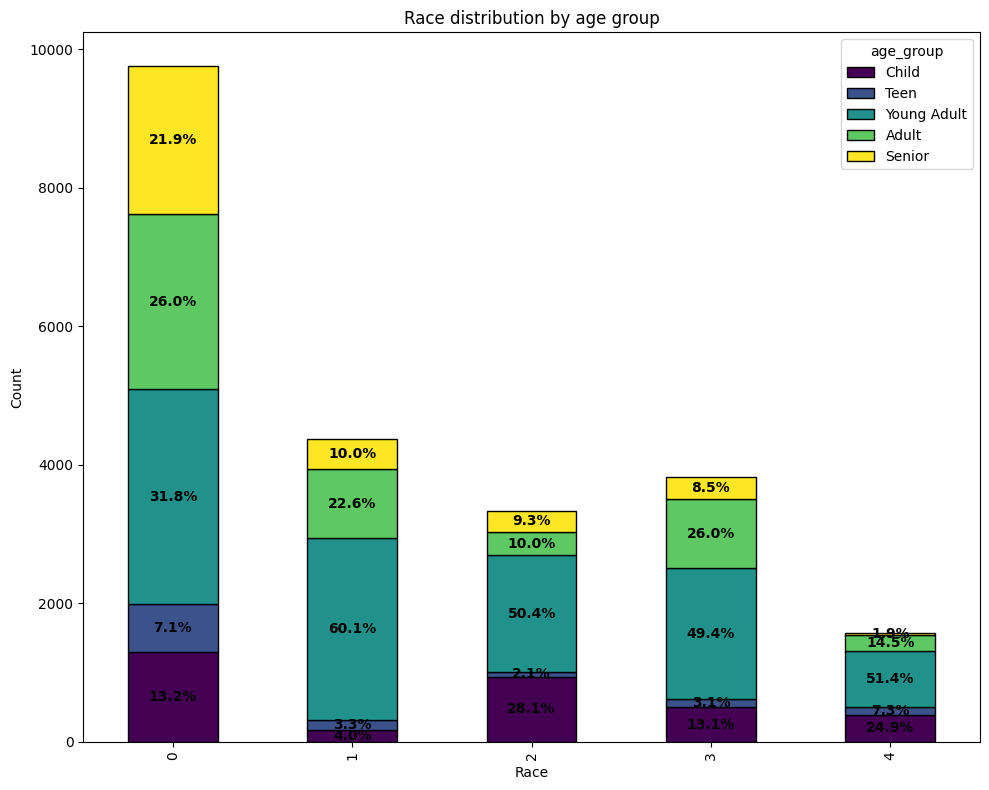

In [ ]:
ax = race_age_counts.plot(kind='bar', stacked=True, colormap='viridis', edgecolor='black', figsize=(10, 8))
plt.title("Race distribution by age group")
plt.xlabel("Race")
plt.ylabel("Count")

race_totals = race_age_counts.sum(axis=1)

for race_idx, (race, row) in enumerate(race_age_counts.iterrows()):
    total = race_totals[race]
    for age_group_idx, count in enumerate(row):
        proportion = count / total
        if count > 0:
            ax.text(race_idx, row.cumsum()[age_group_idx] - count / 2,
                    f"{proportion:.1%}", ha="center", va="center", fontweight="bold", color="black")

plt.tight_layout()
plt.show()

We can see that black individuals mostly have young adult group represented, more than 60%, similiar trend is appears for other less reprenseted races. White race seems to be mostly balanced.

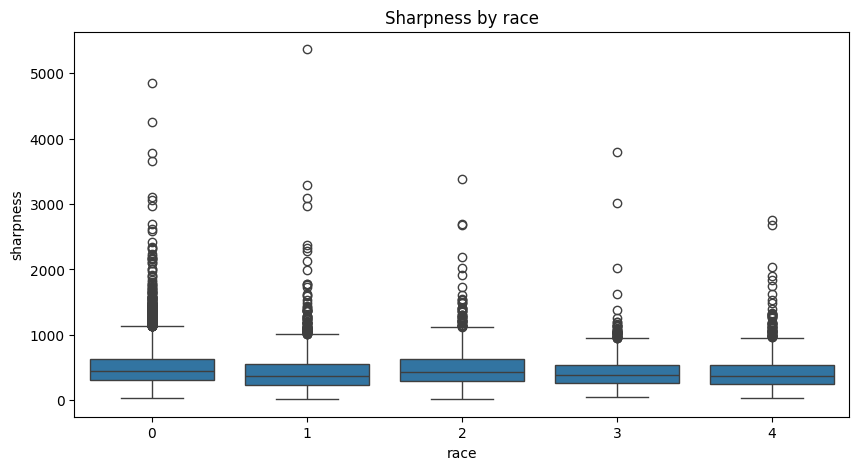

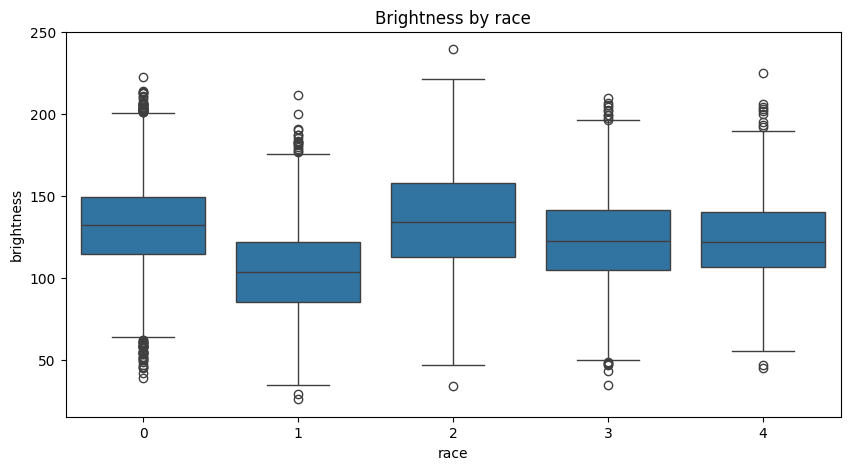

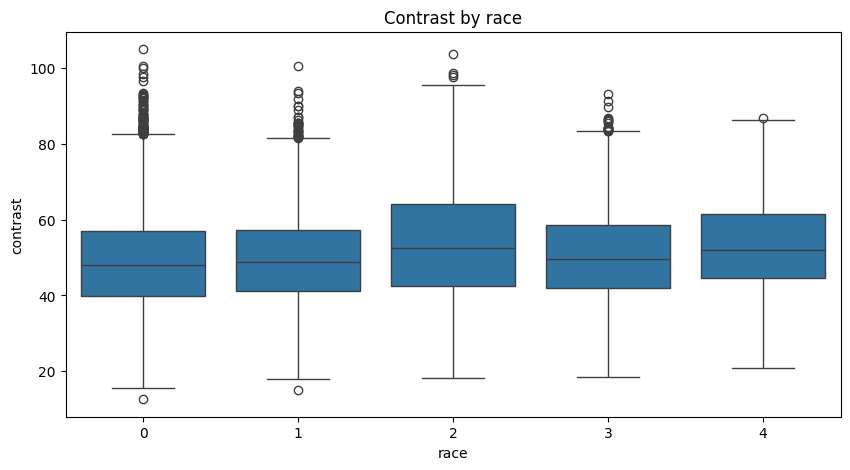

In [ ]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='race', y='sharpness', data=cleaned_metadata_df)
plt.title("Sharpness by race")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='race', y='brightness', data=cleaned_metadata_df)
plt.title("Brightness by race")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(x='race', y='contrast', data=cleaned_metadata_df)
plt.title("Contrast by race")
plt.show()

The distributions among different racial groups show similarities to some extent, suggesting a degree of uniformity in how the images were captured or processed. However, the dataset shows lower brightness levels for images of Black individuals (Race 1). This is most likely a reflection of natural variations in skin tones rather than an artifact of the dataset.

**Images count distribution by gender, race and age groups.**

<ipython-input-75-22650e86daf6>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_race_gender_counts = cleaned_metadata_df.groupby(['age_group', 'race', 'gender']).size().unstack(fill_value=0)


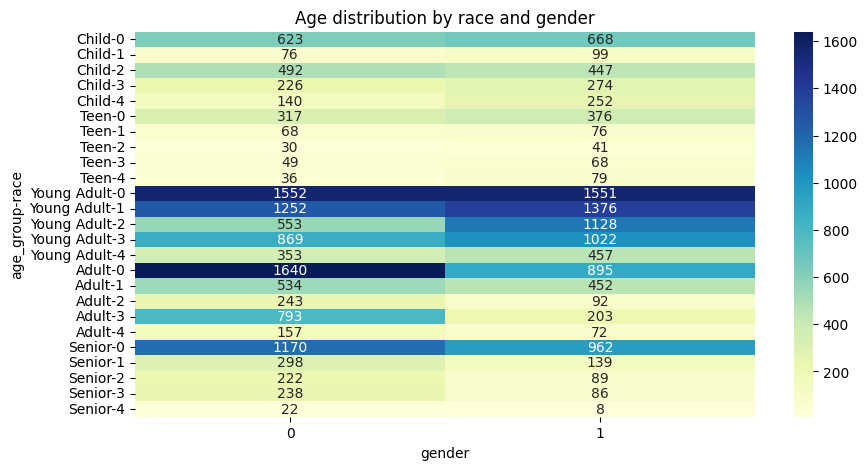

In [ ]:
age_race_gender_counts = cleaned_metadata_df.groupby(['age_group', 'race', 'gender']).size().unstack(fill_value=0)

plt.figure(figsize=(10, 5))
sns.heatmap(age_race_gender_counts, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Age distribution by race and gender")
plt.show()

The dataset analysis reveals significant imbalances across age, race, and gender groups. There is a strong overrepresentation of Young Adult and Adult age groups especially within certain racial categories, while Children, Teens, and Seniors are underrepresented, particularly in racial groups like "other" race. Gender distribution as viewed before is quite imbalanced especially when it come to asian and indian adults and young adults within asian individuals.

In [ ]:
numeric_features = cleaned_metadata_df[['age', 'sharpness', 'brightness', 'contrast']]
correlation_matrix = numeric_features.corr()

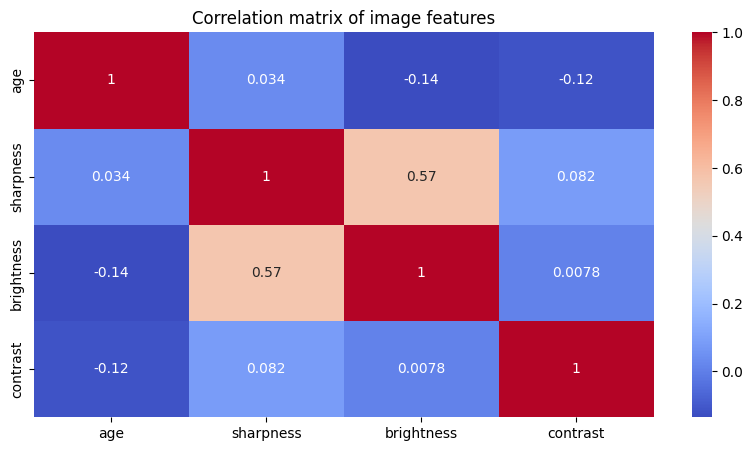

In [ ]:
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation matrix of image features")
plt.show()

Age has weak negative correlations with both brightness (-0.13) and contrast (-0.12). This indicates that as age increases, brightness and contrast slightly decrease, but the effect is minimal.

### Summary

**Dataset Proportions and Demographics**

The dataset exhibits slight gender imbalance with males comprising 52.2% and females 47.8%. While minor this imbalance could introduce subtle biases in model learning if not addressed.

Age distribution is skewed toward younger individuals particularly in the 20–30 age range with fewer samples in older age groups. This imbalance could affect the models ability to predict age accurately for underrepresented groups such as seniors and children.

Racial representation is notably uneven with white individuals making up approximately 43% of the dataset. Other racial groups are significantly underrepresented. Additionally age group distributions reveal that Black individuals fall into the young adult category with over 60% representation, while white individuals show a more balanced distribution across age groups. These demographic imbalances suggest there might potential biases in the model.

**Image characteristics**

All images are uniformly sized at 200x200 pixels eliminating the need for resizing during preprocessing. While all images are in RGB format, some appear grayscale. While this may subtly affect the models ability to learn certain features it also introduces a real world scenario of grayscale images.

A significant number of perceptual duplicates were identified using pHash analysis where nearly identical images were labeled with different age values. In total 450 images across 221 duplicate groups were identified and removed. These inconsistencies highlight labeling challenges that could confuse the model during training.

Brightness appears evenly distributed across genders but is lower for Black individuals compared to other racial groups. This difference likely reflects natural variations in skin tones rather than artifacts from data preprocessing. Brightness and contrast vary slightly across age groups with Child and Teen categories showing lower contrast. Contrast differences between genders are more visible with female images generally having higher contrast than male images. Sharpness variability is minor across age groups though seniors exhibit slightly higher sharpness variability.

**Overall summary**

The dataset reveals imbalances in demographic representation and subtle variations in image characteristics across gender, race and age groups. These factors could introduce sample biases favoring overrepresented groups potentially affecting model fairness and performance.



---

**Modelling**

Before proceeding we think it is essential to acknowledge that while gender and age classification is a medium risk task explainability and attention to possible biases remains critical consideration. Unlike high stakes areas such as medical diagnosis or financial lending the impact of predictions here might seem less severe. However, the models capacity to accurately and fairly capture features across all age groups, genders and races is important, as these predictions touch on aspects of personal identity and respect. Misclassifications or biased predictions could reinforce stereotypes, misrepresent individuals or impact the models fairness in sensitive applications like customer profiling or maybe recruitment. Therefore, while we will used advanced more black box like models to maximize accuracy, f1 score and MAE we also commit to evaluating the models performance across different demographics to identify any imbalances in the predictions.

In [ ]:
#cleaned_metadata_df.to_csv('/content/cleaned_metadata.csv', index=False)